<h1>Final Project - MDdDM</h1>
<h3>As the final project, we must create a segmentation aiming to target insurances customers based on the K-Means clustering method</h3>


<h3>Project Description</h3>
As a Data Mining/Analytic Consultant, you are asked develop a Customer Segmentation in such a way that it will be possible for the Marketing Department to better understand all the different Customers’ Profiles.

You are expected to define, describe and explain the clusters you chose. Invest time in reasoning how you want to do your clustering, possible approaches, and advantages or disadvantages of different decisions. Simultaneous, you should express the marketing approach you recommend for each cluster. 

In [193]:
import pandas as pd
import numpy  as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
import sys
np.set_printoptions(threshold=sys.maxsize)
np.set_printoptions(suppress=True)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: '%.5f' % x)

<h2>Business Understanding</h2>

# TBD

<h2>Data Import and Understanding</h2>

<p>To import the data, we will simply use the function .read_sas from <b>Pandas<b> and call our DataFrame <b>"df"<b>.<p>
<p>Later, we will use some descriptive methods to understand our DataFrame and be prepare to work on it<p>
<h4>Descrtiptive Methods:<h4>
<ul>
<il>.info()<il>
<il>.unique()<il>
<il>.describe()<il>
<il>.isnull()<il>
<ul>



In [194]:
df = pd.read_sas('a2z_insurance.sas7bdat')

df.shape
df.info()
df.head()

(10296, 14)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10296 entries, 0 to 10295
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10296 non-null  float64
 1   FirstPolYear   10266 non-null  float64
 2   BirthYear      10279 non-null  float64
 3   EducDeg        10279 non-null  object 
 4   MonthSal       10260 non-null  float64
 5   GeoLivArea     10295 non-null  float64
 6   Children       10275 non-null  float64
 7   CustMonVal     10296 non-null  float64
 8   ClaimsRate     10296 non-null  float64
 9   PremMotor      10262 non-null  float64
 10  PremHousehold  10296 non-null  float64
 11  PremHealth     10253 non-null  float64
 12  PremLife       10192 non-null  float64
 13  PremWork       10210 non-null  float64
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.00000,1985.00000,1982.00000,b'2 - High School',2177.00000,1.00000,1.00000,380.97000,0.39000,375.85000,79.45000,146.36000,47.01000,16.89000
1,2.00000,1981.00000,1995.00000,b'2 - High School',677.00000,4.00000,1.00000,-131.13000,1.12000,77.46000,416.20000,116.69000,194.48000,106.13000
2,3.00000,1991.00000,1970.00000,b'1 - Basic',2277.00000,3.00000,0.00000,504.67000,0.28000,206.15000,224.50000,124.58000,86.35000,99.02000
3,4.00000,1990.00000,1981.00000,b'3 - BSc/MSc',1099.00000,4.00000,1.00000,-16.99000,0.99000,182.48000,43.35000,311.17000,35.34000,28.34000
4,5.00000,1986.00000,1973.00000,b'3 - BSc/MSc',1763.00000,4.00000,1.00000,35.23000,0.90000,338.62000,47.80000,182.59000,18.78000,41.45000


In [195]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CustID,10296.00000,NaN,NaN,NaN,5148.50000,2972.34352,1.00000,2574.75000,5148.50000,7722.25000,10296.00000
FirstPolYear,10266.00000,NaN,NaN,NaN,1991.06263,511.26791,1974.00000,1980.00000,1986.00000,1992.00000,53784.00000
BirthYear,10279.00000,NaN,NaN,NaN,1968.00778,19.70948,1028.00000,1953.00000,1968.00000,1983.00000,2001.00000
EducDeg,10279,4,b'3 - BSc/MSc',4799,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10260.00000,NaN,NaN,NaN,2506.66706,1157.44963,333.00000,1706.00000,2501.50000,3290.25000,55215.00000
GeoLivArea,10295.00000,NaN,NaN,NaN,2.70986,1.26629,1.00000,1.00000,3.00000,4.00000,4.00000
Children,10275.00000,NaN,NaN,NaN,0.70676,0.45527,0.00000,0.00000,1.00000,1.00000,1.00000
CustMonVal,10296.00000,NaN,NaN,NaN,177.89260,1945.81151,-165680.42000,-9.44000,186.87000,399.77750,11875.89000
ClaimsRate,10296.00000,NaN,NaN,NaN,0.74277,2.91696,0.00000,0.39000,0.72000,0.98000,256.20000
PremMotor,10262.00000,NaN,NaN,NaN,300.47025,211.91500,-4.11000,190.59000,298.61000,408.30000,11604.42000


<h2>Columns Dropping and Creation</h2>

In [196]:
df['PremSum'] = (df['PremMotor'] + df['PremHousehold'] + df['PremHealth'] + df['PremLife'] + df['PremWork']) * 2
df['Age'] = 2016 - df.BirthYear
df['YearsOfCustomer'] = 2016 - df.FirstPolYear
df.drop(['FirstPolYear', 'BirthYear'], axis=1, inplace=True)

df.head()

,CustID,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,PremSum,Age,YearsOfCustomer
0,1.00000,b'2 - High School',2177.00000,1.00000,1.00000,380.97000,0.39000,375.85000,79.45000,146.36000,47.01000,16.89000,1331.12000,34.00000,31.00000
1,2.00000,b'2 - High School',677.00000,4.00000,1.00000,-131.13000,1.12000,77.46000,416.20000,116.69000,194.48000,106.13000,1821.92000,21.00000,35.00000
2,3.00000,b'1 - Basic',2277.00000,3.00000,0.00000,504.67000,0.28000,206.15000,224.50000,124.58000,86.35000,99.02000,1481.20000,46.00000,25.00000
3,4.00000,b'3 - BSc/MSc',1099.00000,4.00000,1.00000,-16.99000,0.99000,182.48000,43.35000,311.17000,35.34000,28.34000,1201.36000,35.00000,26.00000
4,5.00000,b'3 - BSc/MSc',1763.00000,4.00000,1.00000,35.23000,0.90000,338.62000,47.80000,182.59000,18.78000,41.45000,1258.48000,43.00000,30.00000


<h2>Finding and Dealing with Outliers</h2>

Before removing NaN values, we will deal with the Outliers in order to be able to use the data base mean later without overestimating the values.

Source: https://towardsdatascience.com/ways-to-detect-and-remove-the-outliers-404d16608dba

<Figure size 1440x720 with 0 Axes>

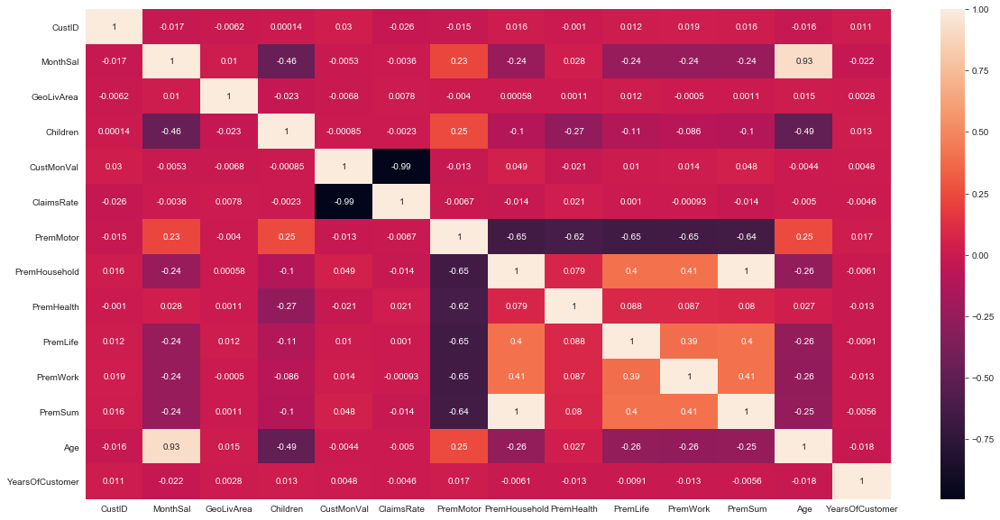

In [197]:
plt.figure(figsize=(20, 10))

heatmap = sns.heatmap(df_clean.corr(), annot=True)

<h3>We find a strong correlation from CustMonVal and ClaimsRate</h3>

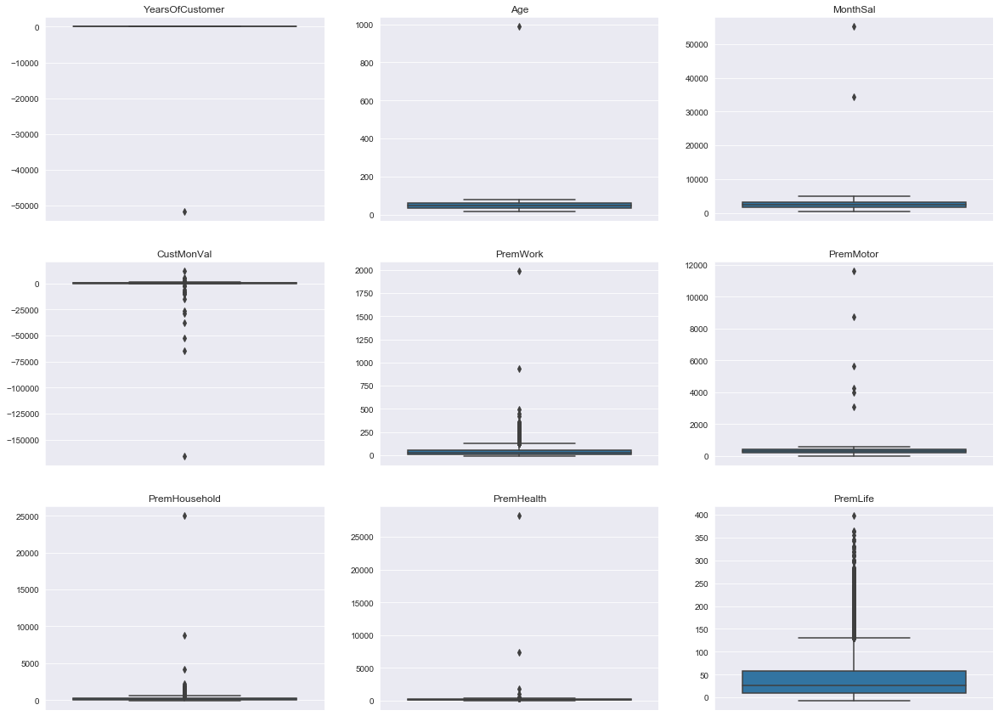

In [198]:
# vars com outliers
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,15))

sns.boxplot(data=df, y='YearsOfCustomer', ax=axes[0][0]).set(ylabel=None);
sns.boxplot(data=df, y='Age', ax=axes[0][1]).set(ylabel=None);
sns.boxplot(data=df, y='MonthSal', ax=axes[0][2]).set(ylabel=None);
sns.boxplot(data=df, y='CustMonVal', ax=axes[1][0]).set(ylabel=None);
sns.boxplot(data=df, y='PremWork', ax=axes[1][1]).set(ylabel=None);
sns.boxplot(data=df, y='PremMotor', ax=axes[1][2]).set(ylabel=None);
sns.boxplot(data=df, y='PremHousehold', ax=axes[2][0]).set(ylabel=None);
sns.boxplot(data=df, y='PremHealth', ax=axes[2][1]).set(ylabel=None);
sns.boxplot(data=df, y='PremLife', ax=axes[2][2]).set(ylabel=None);

axes[0][0].set(title='YearsOfCustomer');
axes[0][1].set(title='Age');
axes[0][2].set(title='MonthSal');
axes[1][0].set(title='CustMonVal');
axes[1][1].set(title='PremWork');
axes[1][2].set(title='PremMotor');
axes[2][0].set(title='PremHousehold');
axes[2][1].set(title='PremHealth');
axes[2][2].set(title='PremLife');

plt.show();

Based on the visualizations above, we decided to do the following cleaning in order to delete the outliers from our table.

<ul>
<li><b>MonthSal</b> < 30000</li>
<li><b>Age</b> > 200</li>
<li><b>YearsOfCustomer</b> < -100 </li>
<li><b>MonthSal</b> > 30000 </li>
<li><b>PremWork</b> > 400 </li>
<li><b>PremMotor</b> > 3000 </li>
<li><b>PremHousehold</b> > 20000 </li>
<li><b>PremHealth</b> > 1000 </li>
<li><b>PremLife</b> > 350 </li>
</ul>

This will remove the wrong filling values in <b>BirthYear</b> and <b>FirstPolYear</b>. Altough we believe that the <b>MonthSal</b> numbers might not be miss filled, we opted to remove this outliers in order for the model to work best.

In [199]:
#Creating df_clean with the instructions above and showing its side compared to the original df
df_clean = df[(df['MonthSal'] < 30000) & (df['Age'] < 200) & (df['YearsOfCustomer'] > -100) & (df['PremWork'] < 400) & (df['PremMotor'] < 3000) & (df['PremHousehold'] < 2000) & (df['PremHealth'] < 1000)& (df['PremLife'] < 350)]

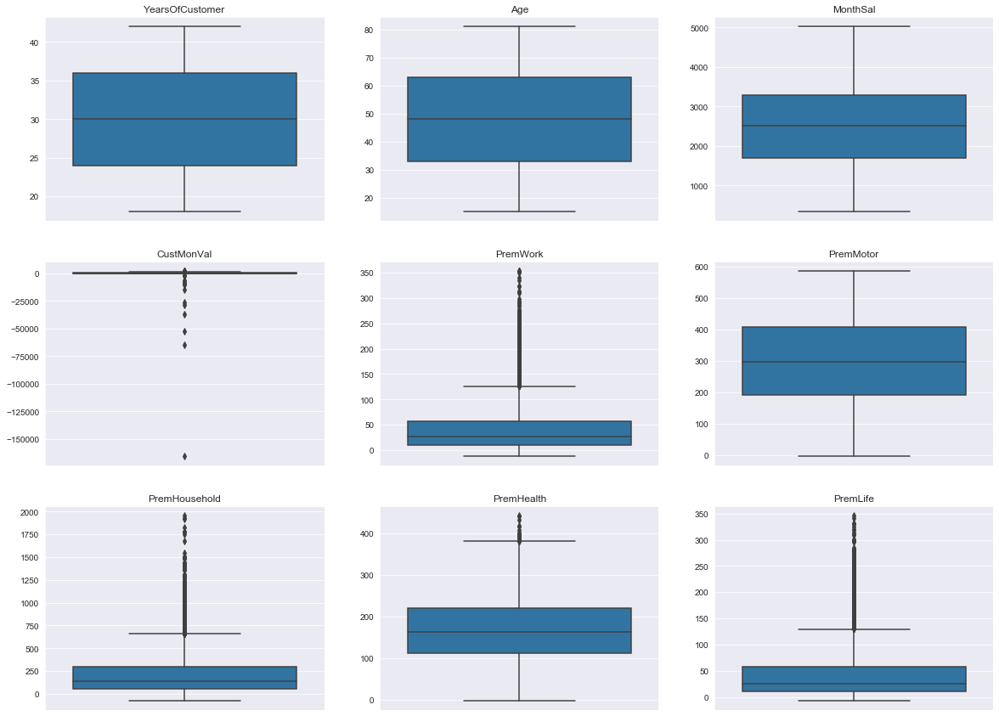

In [200]:
# vars com outliers
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,15))

sns.boxplot(data=df_clean, y='YearsOfCustomer', ax=axes[0][0]).set(ylabel=None);
sns.boxplot(data=df_clean, y='Age', ax=axes[0][1]).set(ylabel=None);
sns.boxplot(data=df_clean, y='MonthSal', ax=axes[0][2]).set(ylabel=None);
sns.boxplot(data=df_clean, y='CustMonVal', ax=axes[1][0]).set(ylabel=None);
sns.boxplot(data=df_clean, y='PremWork', ax=axes[1][1]).set(ylabel=None);
sns.boxplot(data=df_clean, y='PremMotor', ax=axes[1][2]).set(ylabel=None);
sns.boxplot(data=df_clean, y='PremHousehold', ax=axes[2][0]).set(ylabel=None);
sns.boxplot(data=df_clean, y='PremHealth', ax=axes[2][1]).set(ylabel=None);
sns.boxplot(data=df_clean, y='PremLife', ax=axes[2][2]).set(ylabel=None);

axes[0][0].set(title='YearsOfCustomer');
axes[0][1].set(title='Age');
axes[0][2].set(title='MonthSal');
axes[1][0].set(title='CustMonVal');
axes[1][1].set(title='PremWork');
axes[1][2].set(title='PremMotor');
axes[2][0].set(title='PremHousehold');
axes[2][1].set(title='PremHealth');
axes[2][2].set(title='PremLife');

plt.show();

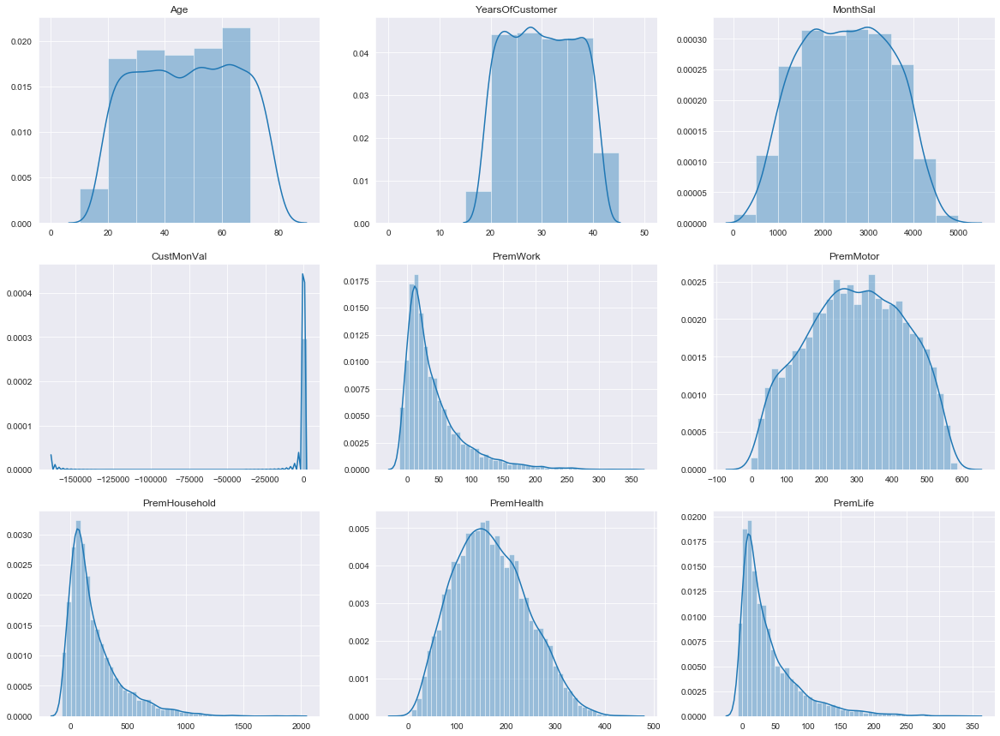

In [201]:
# vars com outliers
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,15))

sns.distplot(df_clean["Age"], bins=[0, 10, 20, 30, 40, 50, 60, 70], ax=axes[0][0]).set(xlabel=None);
sns.distplot(df_clean["YearsOfCustomer"], bins=[0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50], ax=axes[0][1]).set(xlabel=None);
#sns.distplot(df["FirstPolYear"], bins=[1960, 1970, 1980, 1990, 2000, 2010], ax=axes[0][0]).set(xlabel=None);
#sns.distplot(df["BirthYear"], bins=[1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990, 2000, 2010], ax=axes[0][1]).set(xlabel=None);
sns.distplot(df_clean["MonthSal"], bins=[0, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000], ax=axes[0][2]).set(xlabel=None);
sns.distplot(df_clean["CustMonVal"], ax=axes[1][0]).set(xlabel=None);
sns.distplot(df_clean["PremWork"], ax=axes[1][1]).set(xlabel=None);
sns.distplot(df_clean["PremMotor"], ax=axes[1][2]).set(xlabel=None);
sns.distplot(df_clean["PremHousehold"], ax=axes[2][0]).set(xlabel=None);
sns.distplot(df_clean["PremHealth"], ax=axes[2][1]).set(xlabel=None);
sns.distplot(df_clean["PremLife"], ax=axes[2][2]).set(xlabel=None);


axes[0][0].set(title='Age');
axes[0][1].set(title='YearsOfCustomer');
axes[0][2].set(title='MonthSal');
axes[1][0].set(title='CustMonVal');
axes[1][1].set(title='PremWork');
axes[1][2].set(title='PremMotor');
axes[2][0].set(title='PremHousehold');
axes[2][1].set(title='PremHealth');
axes[2][2].set(title='PremLife');

plt.show();

In [202]:
print(round(df_clean.shape[0] / df.shape[0], 2),'%')
print(df.shape[0] - df_clean.shape[0])

0.97 %
320


Now that we have dealed with the last sensitive columns from our data, let's look at the <b>"CustMonVal"</b> numbers.

<b>Remember:</b> we don't want to remove all outliers from this column because it could allow our model to later find customers that might be a big source of profit or the opposite.

<h2>Data Exploration</h2>

<h3>Issue 1: Age < YearsOf Customer</h3>

The first issue we found is regarding the amount of people who had insurances for more time that were alived.

<b>There is a total of 1.941 people with Years as a Customer bigger than their ages.</b>

In [203]:
df_clean[df_clean.Age < df_clean.YearsOfCustomer]

,CustID,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,PremSum,Age,YearsOfCustomer
1,2.00000,b'2 - High School',677.00000,4.00000,1.00000,-131.13000,1.12000,77.46000,416.20000,116.69000,194.48000,106.13000,1821.92000,21.00000,35.00000
13,14.00000,b'1 - Basic',1043.00000,3.00000,1.00000,-75.12000,1.06000,44.34000,342.85000,127.69000,267.94000,94.46000,1754.56000,16.00000,33.00000
18,19.00000,b'1 - Basic',1414.00000,3.00000,1.00000,230.38000,0.71000,313.17000,373.40000,121.80000,14.78000,72.57000,1791.44000,34.00000,35.00000
22,23.00000,b'2 - High School',1495.00000,1.00000,1.00000,-89.79000,1.08000,209.04000,308.95000,192.48000,64.79000,54.90000,1660.32000,30.00000,40.00000
40,41.00000,b'2 - High School',1177.00000,4.00000,1.00000,121.36000,0.84000,52.01000,455.65000,135.47000,146.36000,148.03000,1875.04000,21.00000,22.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10267,10268.00000,b'1 - Basic',834.00000,4.00000,1.00000,254.72000,0.67000,181.48000,309.50000,134.58000,114.80000,98.24000,1677.20000,20.00000,39.00000
10268,10269.00000,b'3 - BSc/MSc',1414.00000,3.00000,1.00000,50.46000,0.90000,129.58000,167.80000,184.48000,165.92000,75.46000,1446.48000,28.00000,29.00000
10273,10274.00000,b'2 - High School',1035.00000,1.00000,1.00000,293.51000,0.58000,235.71000,195.60000,103.13000,170.92000,58.12000,1526.96000,24.00000,27.00000
10288,10289.00000,b'2 - High School',1465.00000,1.00000,1.00000,795.15000,0.35000,67.79000,820.15000,102.13000,182.48000,86.46000,2518.02000,23.00000,34.00000


<h3>Issue 2: Under 16 with Insurances</h3>

There is 12 clients under 16 that has values for PremHousehold, PremWork and PremMotor, which wouldn't make sense for such audience.

In [204]:
df_U16 = df_clean[(df['Age'] < 16)]
df_U16[['CustID', 'Age', 'MonthSal', 'PremMotor', 'PremHousehold', 'PremWork', 'PremLife', 'PremHealth']]

df_U16.shape

,CustID,Age,MonthSal,PremMotor,PremHousehold,PremWork,PremLife,PremHealth
659,660.00000,15.00000,1284.00000,46.23000,1079.65000,-10.00000,252.27000,72.68000
689,690.00000,15.00000,1180.00000,54.90000,406.20000,256.05000,112.02000,65.79000
865,866.00000,15.00000,562.00000,40.34000,847.95000,112.13000,178.70000,94.24000
1436,1437.00000,15.00000,823.00000,129.58000,177.80000,218.15000,176.70000,58.01000
2579,2580.00000,15.00000,1006.00000,48.23000,396.75000,24.45000,127.58000,291.50000
3146,3147.00000,15.00000,372.00000,60.68000,270.60000,107.13000,182.48000,177.59000
4465,4466.00000,15.00000,958.00000,28.56000,1359.15000,179.59000,38.23000,68.79000
4483,4484.00000,15.00000,1241.00000,43.34000,589.55000,179.48000,121.80000,142.47000
5347,5348.00000,15.00000,1119.00000,148.14000,628.45000,30.23000,45.12000,221.82000
5607,5608.00000,15.00000,1131.00000,43.23000,690.70000,142.25000,87.35000,157.03000


(12, 15)

<h3>Issue 3: Sum of Premiums > MonthSal</h3>

Apparently, there is noone else who has MonthSal smaller than it total monthly premium.

In [205]:
df_clean[(df_clean.PremSum / 12) > df_clean.MonthSal]

,CustID,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,PremSum,Age,YearsOfCustomer


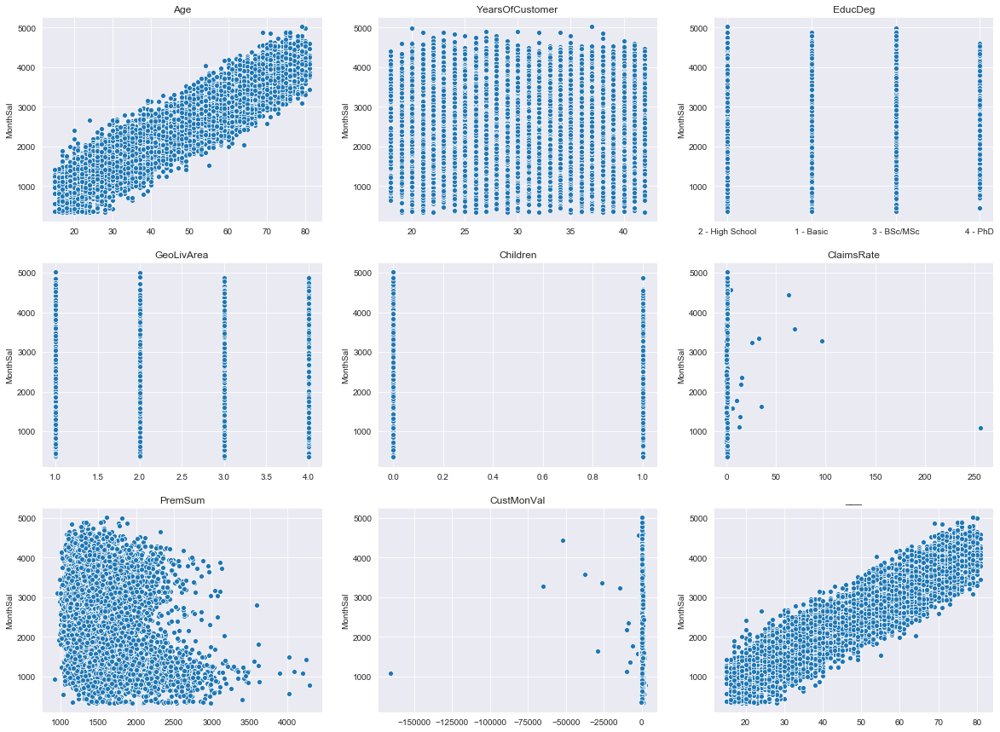

In [206]:
# correlacoes com MonthSal
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,15))

sns.scatterplot(data=df_clean, x="Age", y="MonthSal", ax=axes[0][0]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="YearsOfCustomer", y="MonthSal", ax=axes[0][1]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="EducDeg", y="MonthSal", ax=axes[0][2]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="GeoLivArea", y="MonthSal", ax=axes[1][0]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="Children", y="MonthSal", ax=axes[1][1]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="ClaimsRate", y="MonthSal", ax=axes[1][2]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="PremSum", y="MonthSal", ax=axes[2][0]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="CustMonVal", y="MonthSal", ax=axes[2][1]).set(xlabel=None);
sns.scatterplot(data=df_clean, x="Age", y="MonthSal", ax=axes[2][2]).set(xlabel=None);

axes[0][0].set(title='Age');
axes[0][1].set(title='YearsOfCustomer');
axes[0][2].set(title='EducDeg');
axes[1][0].set(title='GeoLivArea');
axes[1][1].set(title='Children');
axes[1][2].set(title='ClaimsRate');
axes[2][0].set(title='PremSum');
axes[2][1].set(title='CustMonVal');
axes[2][2].set(title='___');

plt.show();

<h2>Dealing with NaN Values</h2>

Support links:

http://towardsdatascience.com/handling-missing-values-with-pandas-b876bf6f008f

https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html


In [207]:
print(df_clean.isna().sum())

CustID              0
EducDeg             0
MonthSal            0
GeoLivArea          0
Children           13
CustMonVal          0
ClaimsRate          0
PremMotor           0
PremHousehold       0
PremHealth          0
PremLife            0
PremWork            0
PremSum             0
Age                 0
YearsOfCustomer     0
dtype: int64


In [208]:
#As we only have one missing value for the educational column, we will simple replace the missing value with the value from the column before.
df_clean['EducDeg'].fillna(axis=0, method='ffill', inplace=True)

print(df_clean.isna().sum())

CustID              0
EducDeg             0
MonthSal            0
GeoLivArea          0
Children           13
CustMonVal          0
ClaimsRate          0
PremMotor           0
PremHousehold       0
PremHealth          0
PremLife            0
PremWork            0
PremSum             0
Age                 0
YearsOfCustomer     0
dtype: int64


For the columns <b>"PremMotor"</b>, <b>"PremHousehold"</b>, <b>"PremHealth"</b>, <b>"PremLife"</b>, and <b>"PremWork"</b>, we assumed that the missing values meant that the custmer did not had that product. We then decided to create a colum for each of these products before dealing with these NaN

In [209]:
#

#df_clean['hasMotor'] = np.where(np.any(np.isnan(t1['PremMotor'])), 1,0)
#df_clean['hasHealth'] = np.where(np.any(np.isnan(t1['PremHealth'])), 1,0)
#df_clean['hasLife'] = np.where(np.any(np.isnan(t1['PremLife'])), 1,0)
#df_clean['hasWork'] = np.where(np.any(np.isnan(t1['PremWork'])), 1,0)

#df_clean.head()